# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [1]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
from torch import tensor

## Generating single value from normal distribution with given mean and variance

In [2]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(8.4026)


## Sampling from categorical probabilities with given probabilities

In [3]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(1)


## Animating data

/home/lukasz/.local/lib/python3.6/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


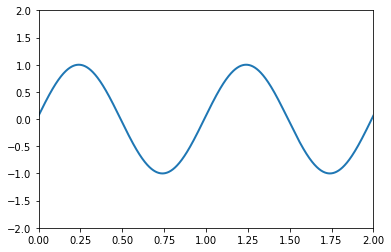

In [4]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

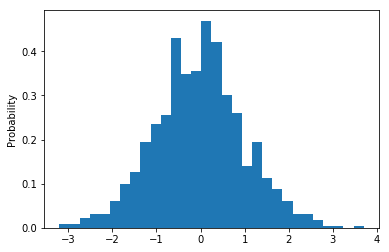

In [5]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability');

## Task 1

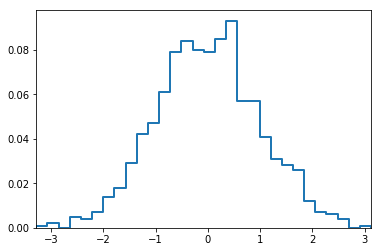

In [6]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    line, = ax.plot([], [], lw=2)
    
    rand_values = np.random.normal(size = 1000)
    ax.set_xlim(min(rand_values), max(rand_values))
    
    # auxiliary function to dermine histogram line
    def prepare_hist_line(hist, bin_edges):
        # start drawing on x axis
        x = [bin_edges[0]]
        y = [0]
        
        # draw histogram
        for i in range(0,len(hist)):
            x.append(bin_edges[i])
            x.append(bin_edges[i+1])
            y.append(hist[i])
            y.append(hist[i])
            
        #stop drawing on y axis
        x.append(bin_edges[-1])
        y.append(0)
        
        return x, y
    
    # animation function. This is called sequentially
    def dist(i):
        hist, bin_edges = np.histogram(rand_values[:i+1], bins=30)
        hist = hist / len(rand_values[:i+1])
        x, y = prepare_hist_line(hist, bin_edges)
        line.set_data(x, y)
        
        ax.set_ylim(min(hist), max(hist)*1.05)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    # frames = 1000 and interval = 1 makes it changes slowly but it is desired behavior
    anim = animation.FuncAnimation(fig, dist, init_func=init,
                                   frames=1000, interval=1, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Task 2
$A$ - test's result is positive (suggesting disease)<br/>
$B$ - patient has a disease<br/>
$P(A|B') = 0.02$<br/>
$P(A'|B) = 0.01$<br/>
<br/>
$P(A|B) = 0.99$<br/>
$P(A'|B') = 0.98$<br/>
<br/>
$P(B|A) = ?$<br/>

### Bayes' Theorem
$$
P(B|A) = \frac{P(A|B)*P(B)}{P(A)}
$$

$P(A)$ is unknown.
$$
P(A) = P(A\cap B) + P(A\cap B')
$$
$$
P(A) = P(A|B)*P(B)+P(A|B')*P(B')
$$

In [7]:
"""
A - test's result is positive (suggesting disease)
B - patient has a disease
P(A|B') = 0.02
P(A'|B) = 0.01

P(A|B) = 0.99
P(A'|B') = 0.98

P(B|A) = ?
"""

def generate_examples(prob_ill, num_examples):
    x = [pyro.sample("categorical_sampling", pyro.distributions.Categorical(
        tensor([1-prob_ill, prob_ill]))) for i in range(num_examples)]
    return x


def test_disease(is_ill):
    if is_ill:
        positive_prob = 0.99
    else:
        positive_prob = 0.02
    
    return pyro.sample("categorical_sampling", pyro.distributions.Categorical(
           tensor([1-positive_prob, positive_prob])))


def simulate_prob(prob_ill, num_samples):
    x = generate_examples(prob_ill, num_samples)
    print("Number of people having disease: ", x.count(tensor(1)))
    
    pred = [test_disease(x_i==tensor(1)) for x_i in x]

    true_pos = 0
    false_pos = 0
    false_neg = 0
    true_neg = 0
    
    for i in range(len(x)):
        if x[i] == pred[i] == tensor(1):
            true_pos += 1
        elif pred[i] == tensor(1) and x[i] == tensor(0):
            false_pos += 1
        elif pred[i] == tensor(0) and x[i] == tensor(1):
            false_neg += 1
        elif pred[i] == x[i] == tensor(0):
            true_neg += 1
            
    return true_pos/(true_pos+false_pos)

def count_prob_bayes(prob_ill):
    """ Counting result using Bayes' theorem. """
    true_positive = 0.99 # P(A|B)
    prob_positive = 0.99*prob_ill + 0.02*(1-prob_ill) # P(A)
    return true_positive*prob_ill/prob_positive

# params of the simulation
num_ill_for_50k = 100
simulation_size = 500000
prob_ill = num_ill_for_50k/50000.0
print("Parameters:")
print("Probability of being ill: {0}".format(prob_ill))
print("Size of population: {0}\n".format(simulation_size))

print("Probability of having disease if the result comes back posiitive:")
print("Simulated: ", simulate_prob(prob_ill, simulation_size))
print("Counted using Bayes' theorem: ", count_prob_bayes(prob_ill))

Parameters:
Probability of being ill: 0.002
Size of population: 500000

Probability of having disease if the result comes back posiitive:
Number of people having disease:  1020
Simulated:  0.09292076026076578
Counted using Bayes' theorem:  0.09024612579762989
